<a href="https://colab.research.google.com/github/zolo012/Machine_learning/blob/main/Lasso_ridge_elasticnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lasso, Ridge and Elasticnet 

Creator: Zoltan Bereczki

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.datasets import make_regression
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, mean_squared_error
import io

# 1. Implement a linear model
- return the weight parameters w = (w1, w2, ... , wP) and the intercept parameter w0 separately

- check your returned coefficients with the built in LinearRegression class from the sklearn library, they should be within tolerance 1e-6 to each other

- use a generated regression dataset from sklearn.dataset import make_regression API with parameters n_samples=1000 and n_features=20

In [ ]:
def linear_model(train_x, train_y):
  lrm = LinearRegression()
  lrm.fit(train_x, train_y)
  w0 = lrm.intercept_
  coeff = lrm.coef_
  return w0, coeff

In [ ]:
train_x, train_y = make_regression(n_samples=1000, n_features=20)

linear_model(train_x, train_y)

(-5.329070518200751e-15,
 array([ 3.39983058e+01,  9.57827184e+01,  2.92161140e+01, -2.66724272e-14,
        -1.72059406e-14, -1.18735066e-14,  3.22031424e-14,  8.55150883e+01,
         6.16930800e-14,  8.71351352e+01,  5.10799525e+00, -1.75071198e-14,
         4.43086968e+01,  3.45196880e+01, -1.04719164e-14, -7.65467292e-14,
         1.92789055e+01,  4.04121181e-14,  2.55566015e+01,  7.10542736e-15]))

In [ ]:
# Multiple linear model implementation [source: https://faun.pub/implementing-multiple-linear-regression-from-scratch-in-python-f5d84d4935bb]
def CostFunction(x,y,w,b):
    cost = np.sum((((x.dot(w) + b) - y) ** 2) / (2*len(y)))
    return cost

def GradientDescent(x, y, w, b, learning_rate, epochs):
    cost_list = [0] * epochs
   
    for epoch in range(epochs):
        z = x.dot(w) + b
        loss = z - y
        
        weight_gradient = x.T.dot(loss) / len(y)
        bias_gradient = np.sum(loss) / len(y)
        
        w = w - learning_rate*weight_gradient
        b = b - learning_rate*bias_gradient
  
        cost = CostFunction(x, y, w, b)
        cost_list[epoch] = cost
        '''
        if (epoch%(epochs/10)==0):
            print("Cost is:",cost)
        '''
    return w, b, cost_list

w, b, c= GradientDescent(train_x, train_y, np.zeros(train_x.shape[1]), 0, 0.002,epochs=15000)
print('The coefficients: {}\nIntercept: {}'.format(w, b))

The coefficients: [ 3.39983058e+01  9.57827184e+01  2.92161140e+01 -9.04128145e-10
 -1.32320460e-09  4.19421951e-10 -6.76245786e-10  8.55150883e+01
  2.18242573e-09  8.71351352e+01  5.10799525e+00  4.16978510e-10
  4.43086968e+01  3.45196880e+01 -8.87268500e-10 -1.58906952e-09
  1.92789055e+01  1.01403932e-09  2.55566015e+01  4.39322841e-10]
Intercept: -9.794265097475167e-10


# 2. Use of real data
- download the Communities and Crime Data Set from UCI, the task includes understanding the dataset: naming the appropiate data fields, handling missing values, etc.

- split the data in training/test sets and fit a LinearRegression model with 5-fold cross-validation on top of it - compare training and testing scores (R^2 by default) for the different CV splits, print the mean score and its standard deviation

- fit the best Lasso regression model with 5-fold grid search cross validation (GridSearchCV) on the parameters: alpha, normalize, max_iter and show the best parameters

In [ ]:
from google.colab import files

for i in [1, 2]:
  if i == 1:
    uploaded = files.upload()
    with open('/content/communities.names', 'r') as f:
      f = list(f)
      good_lines_list = [line.split()[1] for line in f if line.startswith('@attribute')]
  elif i == 2:
    uploaded = files.upload()
    communities_df = pd.read_csv(io.BytesIO(uploaded['communities.data']), names=good_lines_list)
communities_df




Saving communities.names to communities (3).names


Saving communities.data to communities (3).data


,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,...,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,?,?,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.00,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,...,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.00,0.12,0.42,0.50,0.51,0.64,0.03,0.13,0.96,0.17,0.06,0.18,0.44,0.13,0.94,0.93,0.03,0.07,0.1,0.07,0.02,0.57,0.29,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,?,?,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.00,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,...,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.00,0.21,0.50,0.34,0.60,0.52,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.02,0.12,0.45,?,?,?,?,0.00,?,0.67
2,24,?,?,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.00,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,...,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.00,0.14,0.49,0.54,0.67,0.56,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.01,0.21,0.02,?,?,?,?,0.00,?,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.00,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,...,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.00,0.19,0.30,0.73,0.64,0.65,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.02,0.39,0.28,?,?,?,?,0.00,?,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.90,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,0.51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,...,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.00,0.11,0.72,0.64,0.61,0.53,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.04,0.09,0.02,?,?,?,?,0.00,?,0.03
5,6,?,?,SouthPasadenacity,1,0.02,0.28,0.06,0.54,1.00,0.25,0.31,0.48,0.27,0.37,0.04,1.00,0.52,0.68,0.20,0.61,0.28,0.15,0.25,0.62,0.72,0.76,0.77,0.28,0.52,0.48,0.60,0.01,0.12,0.13,0.12,0.80,0.10,0.65,0.19,...,0.63,0.68,0.62,0.47,0.59,0.11,0.00,0.00,0.70,0.42,0.49,0.73,0.64,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.01,0.58,0.10,?,?,?,?,0.00,?,0.14
6,44,7,41500,Lincolntown,1,0.01,0.39,0.00,0.98,0.06,0.02,0.30,0.37,0.23,0.60,0.02,0.81,0.42,0.50,0.23,0.68,0.61,0.21,0.54,0.43,0.47,0.44,0.40,0.24,0.86,0.24,0.36,0.01,0.11,0.29,0.41,0.36,0.28,0.54,0.44,...,0.35,0.42,0.35,0.46,0.44,0.31,0.00,0.00,0.15,0.81,0.77,0.91,0.84,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.05,0.08,0.06,?,?,?,?,0.00,?,0.03
7,6,?,?,Selmacity,1,0.01,0.74,0.03,0.46,0.20,1.00,0.52,0.55,0.36,0.35,0.00,0.00,0.16,0.44,1.00,0.23,0.53,0.97,0.41,0.15,0.10,0.12,0.08,0.17,0.27,0.18,0.21,0.03,0.64,0.96,0.82,0.12,1.00,0.26,0.43,...,0.24,0.25,0.24,0.64,0.59,0.28,0.00,0.00,0.59,0.58,0.52,0.79,0.78,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,0.01,0.33,0.00,?,?,?,?,0.00,?,0.55
8,21,?,?,Hendersoncity,1,0.03,0.34,0.20,0.84,0.02,0.00,0.38,0.45,0.28,0.48,0.04,1.00,0.17,0.47,0.36,0.34,0.55,0.48,0.43,0.21,0.23,0.23,0.19,0.10,0.2

In [ ]:
# Replace '?' with NAN
communities_df.replace('?', np.nan, inplace=True)
communities_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,...,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.00,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,...,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.00,0.12,0.42,0.50,0.51,0.64,0.03,0.13,0.96,0.17,0.06,0.18,0.44,0.13,0.94,0.93,0.03,0.07,0.1,0.07,0.02,0.57,0.29,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.00,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,...,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.00,0.21,0.50,0.34,0.60,0.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.00,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,...,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.00,0.14,0.49,0.54,0.67,0.56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.00,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,...,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.00,0.19,0.30,0.73,0.64,0.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.90,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,0.51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,...,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.00,0.11,0.72,0.64,0.61,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
5,6,NaN,NaN,SouthPasadenacity,1,0.02,0.28,0.06,0.54,1.00,0.25,0.31,0.48,0.27,0.37,0.04,1.00,0.52,0.68,0.20,0.61,0.28,0.15,0.25,0.62,0.72,0.76,0.77,0.28,0.52,0.48,0.60,0.01,0.12,0.13,0.12,0.80,0.10,0.65,0.19,...,0.63,0.68,0.62,0.47,0.59,0.11,0.00,0.00,0.70,0.42,0.49,0.73,0.64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.58,0.10,NaN,NaN,NaN,NaN,0.00,NaN,0.14
6,44,7,41500,Lincolntown,1,0.01,0.39,0.00,0.98,0.06,0.02,0.30,0.37,0.23,0.60,0.02,0.81,0.42,0.50,0.23,0.68,0.61,0.21,0.54,0.43,0.47,0.44,0.40,0.24,0.86,0.24,0.36,0.01,0.11,0.29,0.41,0.36,0.28,0.54,0.44,...,0.35,0.42,0.35,0.46,0.44,0.31,0.00,0.00,0.15,0.81,0.77,0.91,0.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.05,0.08,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.03
7,6,NaN,NaN,Selmacity,1,0.01,0.74,0.03,0.46,0.20,1.00,0.52,0.55,0.36,0.35,0.00,0.00,0.16,0.44,1.00,0.23,0.53,0.97,0.41,0.15,0.10,0.12,0.08,0.17,0.27,0.18,0.21,0.03,0.64,0.96,0.82,0.12,1.00,0.26,0.43,..

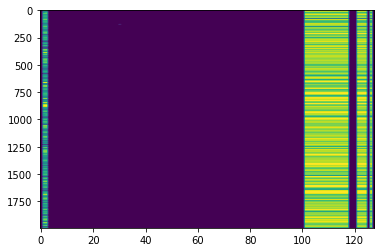

In [ ]:
# Investigate missing values

plt.imshow(communities_df.isna(), aspect='auto')

In [ ]:
pd.set_option('display.max_rows',None)
communities_df.isna().sum()

state                    0
communityname            0
fold                     0
population               0
householdsize            0
racepctblack             0
racePctWhite             0
racePctAsian             0
racePctHisp              0
agePct12t21              0
agePct12t29              0
agePct16t24              0
agePct65up               0
numbUrban                0
pctUrban                 0
medIncome                0
pctWWage                 0
pctWFarmSelf             0
pctWInvInc               0
pctWSocSec               0
pctWPubAsst              0
pctWRetire               0
medFamInc                0
perCapInc                0
whitePerCap              0
blackPerCap              0
indianPerCap             0
AsianPerCap              0
OtherPerCap              1
HispPerCap               0
NumUnderPov              0
PctPopUnderPov           0
PctLess9thGrade          0
PctNotHSGrad             0
PctBSorMore              0
PctUnemployed            0
PctEmploy                0
P

I can remove many columns because of more than 50% of rows are lacking in these columns (24): **county, community, lemasSwornFT, lemasSwFTPerPop, lemasSwFTFieldOps, lemasSwFTFieldPerPop, lemasTotalReq, lemasTotReqPerPop, policReqPerOffic, policPerPop, racialMatchCommPol, pctPolicWhite, pctPolicBlack, pctPolicHisp, pctPolicAsian, pctPolicMinor, officAssgnDrugUnits, numKindsDrugsSeiz, policAveOTWorked, policCars, policOperBudg, lemasPctPolicOnPatr, lemasGangUnitDeploy, policBudgPerPop**  

And there's only one missing value in column **OtherPerCap**

In [ ]:
communities_df.dropna(thresh=821, axis=1, inplace=True)
communities_df.isna().sum()

state                    0
communityname            0
fold                     0
population               0
householdsize            0
racepctblack             0
racePctWhite             0
racePctAsian             0
racePctHisp              0
agePct12t21              0
agePct12t29              0
agePct16t24              0
agePct65up               0
numbUrban                0
pctUrban                 0
medIncome                0
pctWWage                 0
pctWFarmSelf             0
pctWInvInc               0
pctWSocSec               0
pctWPubAsst              0
pctWRetire               0
medFamInc                0
perCapInc                0
whitePerCap              0
blackPerCap              0
indianPerCap             0
AsianPerCap              0
OtherPerCap              1
HispPerCap               0
NumUnderPov              0
PctPopUnderPov           0
PctLess9thGrade          0
PctNotHSGrad             0
PctBSorMore              0
PctUnemployed            0
PctEmploy                0
P

In [ ]:
# Search the one and last NaN value containing row
communities_df.loc[communities_df['OtherPerCap'].isna() == True, :]

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,...,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
130,28,Natchezcity,1,0.02,0.38,0.98,0.22,0.01,0.01,0.44,0.4,0.27,0.58,0.0,0.0,0.09,0.24,0.35,0.31,0.65,0.78,0.49,0.12,0.18,0.32,0.15,0.08,0.37,NaN,0.63,0.05,0.85,0.54,0.54,0.29,0.86,0.19,0.31,0.53,0.37,...,0.02,0.28,0.24,0.4,0.36,0.47,0.52,0.17,0.46,0.5,0.05,0.52,0.55,0.31,0.68,0.38,0.51,0.55,0.06,0.06,0.08,0.0,0.06,0.11,0.11,0.6,0.44,0.76,0.0,0.0,0.01,0.84,0.7,0.83,0.77,0.04,0.12,0.05,0.0,0.23


In [ ]:
# Check column data types
communities_df.dtypes

state                      int64
communityname             object
fold                       int64
population               float64
householdsize            float64
racepctblack             float64
racePctWhite             float64
racePctAsian             float64
racePctHisp              float64
agePct12t21              float64
agePct12t29              float64
agePct16t24              float64
agePct65up               float64
numbUrban                float64
pctUrban                 float64
medIncome                float64
pctWWage                 float64
pctWFarmSelf             float64
pctWInvInc               float64
pctWSocSec               float64
pctWPubAsst              float64
pctWRetire               float64
medFamInc                float64
perCapInc                float64
whitePerCap              float64
blackPerCap              float64
indianPerCap             float64
AsianPerCap              float64
OtherPerCap               object
HispPerCap               float64
NumUnderPo

I must convert 'OtherPerCap' column into numeric.

In [ ]:
communities_df = communities_df.apply(pd.to_numeric, errors='ignore')
communities_df.dtypes

state                      int64
communityname             object
fold                       int64
population               float64
householdsize            float64
racepctblack             float64
racePctWhite             float64
racePctAsian             float64
racePctHisp              float64
agePct12t21              float64
agePct12t29              float64
agePct16t24              float64
agePct65up               float64
numbUrban                float64
pctUrban                 float64
medIncome                float64
pctWWage                 float64
pctWFarmSelf             float64
pctWInvInc               float64
pctWSocSec               float64
pctWPubAsst              float64
pctWRetire               float64
medFamInc                float64
perCapInc                float64
whitePerCap              float64
blackPerCap              float64
indianPerCap             float64
AsianPerCap              float64
OtherPerCap              float64
HispPerCap               float64
NumUnderPo

In [ ]:
# Replace NaN with columnwise mean
communities_df['OtherPerCap'].fillna(value=communities_df['OtherPerCap'].mean(), inplace=True)
communities_df.isna().sum()

state                    0
communityname            0
fold                     0
population               0
householdsize            0
racepctblack             0
racePctWhite             0
racePctAsian             0
racePctHisp              0
agePct12t21              0
agePct12t29              0
agePct16t24              0
agePct65up               0
numbUrban                0
pctUrban                 0
medIncome                0
pctWWage                 0
pctWFarmSelf             0
pctWInvInc               0
pctWSocSec               0
pctWPubAsst              0
pctWRetire               0
medFamInc                0
perCapInc                0
whitePerCap              0
blackPerCap              0
indianPerCap             0
AsianPerCap              0
OtherPerCap              0
HispPerCap               0
NumUnderPov              0
PctPopUnderPov           0
PctLess9thGrade          0
PctNotHSGrad             0
PctBSorMore              0
PctUnemployed            0
PctEmploy                0
P

In [ ]:
# Prepare models
kfold = KFold(n_splits=5, shuffle=True, random_state=1)
lm = LinearRegression()

In [ ]:
# Remove communities' names, state and fold because those are not predictive
communityname = communities_df.pop('communityname')
state = communities_df.pop('state')
fold = communities_df.pop('fold')

# Extract targets and assign to variabel y

y = communities_df.pop('ViolentCrimesPerPop')
X = communities_df

In [ ]:
X.head()

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,MalePctNevMarr,...,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.0,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,0.41,0.25,0.52,0.68,0.40,...,0.89,0.06,0.14,0.13,0.33,0.39,0.28,0.55,0.09,0.51,0.5,0.21,0.71,0.52,0.05,0.26,0.65,0.14,0.06,0.22,0.19,0.18,0.36,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.0,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.32
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.0,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,0.15,0.42,0.36,1.00,0.63,...,0.84,0.10,0.16,0.10,0.17,0.29,0.17,0.26,0.20,0.82,0.0,0.02,0.79,0.24,0.02,0.25,0.65,0.16,0.00,0.21,0.20,0.21,0.42,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.0,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.00
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.0,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,0.29,0.49,0.32,0.63,0.41,...,0.88,0.04,0.20,0.20,0.46,0.52,0.43,0.42,0.15,0.51,0.5,0.01,0.86,0.41,0.29,0.30,0.52,0.47,0.45,0.18,0.17,0.16,0.27,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.0,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.00
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.0,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,0.45,0.37,0.39,0.34,0.45,...,0.81,0.08,0.56,0.62,0.85,0.77,1.00,0.94,0.12,0.01,0.5,0.01,0.97,0.96,0.60,0.47,0.52,0.11,0.11,0.24,0.21,0.19,0.75,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.0,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.00
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.9,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,0.51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,0.38,0.42,0.46,0.22,0.27,...,0.88,0.05,0.16,0.19,0.59,0.60,0.37,0.89,0.02,0.19,0.5,0.01,0.89,0.87,0.04,0.55,0.73,0.05,0.14,0.31,0.31,0.30,0.40,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.0,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0.00


In [ ]:
kfold.get_n_splits(X)

5

In [ ]:
# Calculate R2 score of train and test data in CV
r2_score_dicty = {x : {} for x in range(1, 6)} 

cntr = 1
for train_i, test_i in kfold.split(X):
  X_train, X_test = X.iloc[train_i, :], X.iloc[test_i, :]
  y_train, y_test = y[train_i], y[test_i]
  #print('X train: ', X_train)
  #print('X test: ', X_test)
  #print('y train: ', y_train)
  #print('y test: ', y_test)
  lm.fit(X_train, y_train)
  y_test_pred = lm.predict(X_test)
  y_train_pred = lm.predict(X_train)
  r2_score_dicty[cntr].update({'test' : r2_score(y_test, y_test_pred),
                            'train' : r2_score(y_train, y_train_pred)})
  cntr += 1

r2_score_dicty

{1: {'test': 0.609105003208259, 'train': 0.7088573299343213},
 2: {'test': 0.6382603988584775, 'train': 0.702525794538922},
 3: {'test': 0.6901135619573675, 'train': 0.6916037075659405},
 4: {'test': 0.6951133482940338, 'train': 0.6884840461758173},
 5: {'test': 0.6436737597291823, 'train': 0.7025570218676405}}

In [ ]:
# Create list of R2 score for getting mean and standard deviation of them
test_score_list = [r2_score_dicty[i]['test'] for i in range(1, 6)]
print(test_score_list)
train_score_list = [r2_score_dicty[i]['train'] for i in range(1, 6)]
print(train_score_list)

[0.609105003208259, 0.6382603988584775, 0.6901135619573675, 0.6951133482940338, 0.6436737597291823]
[0.7088573299343213, 0.702525794538922, 0.6916037075659405, 0.6884840461758173, 0.7025570218676405]


In [ ]:
# Compute mean and standard deviation of R2 scores
print('Test score mean: {}\tTest score std: {}\nTrain score mean: {}\tTrain score std: {}'.format(np.mean(test_score_list), np.std(test_score_list),
                                                                                                  np.mean(train_score_list), np.std(train_score_list)))

Test score mean: 0.655253214409464	Test score std: 0.03273093659695678
Train score mean: 0.6988055800165283	Train score std: 0.007580923638769028


In [ ]:
# Search best parameter set of Lasso model
param_dicty = {'alpha' : np.linspace(0.001, 1, 100),
               'normalize' : [True, False],
               'max_iter' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]}
lasso = Lasso()
grid = GridSearchCV(lasso, param_grid=param_dicty, cv=5, n_jobs=4)
grid.fit(X, y)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.18803202795227492, tolerance: 0.010818395511534601
  positive)


GridSearchCV(cv=5, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=4,
             param_grid={'alpha': array([0.001     , 0.01109091, 0.02118182, 0.03127273, 0.04136364,
       0.05145455, 0.06154545, 0.0716...
       0.85872727, 0.86881818, 0.87890909, 0.889     , 0.89909091,
       0.90918182, 0.91927273, 0.92936364, 0.93945455, 0.94954545,
       0.95963636, 0.96972727, 0.97981818, 0.98990909, 1.        ]),
                         'max_iter': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40,
                                      50, 60, 70, 80, 90, 100, 200, 300, 400,
                                      500, 600, 700, 800, 900, 1000],
                         'normalize': [True, False]},

In [ ]:
best_lasso_param = grid.best_params_
best_lasso_param

{'alpha': 0.001, 'max_iter': 30, 'normalize': False}

In [ ]:
best_result = grid.best_score_
best_result

0.6488640225013362

In [ ]:
np.linspace(0.001, 10, 100)

In [ ]:
param_dicty = {'alpha' : np.linspace(0.0001, 10, 100),
               'max_iter' : [10, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100]}
lasso = Lasso(normalize=False)
grid = GridSearchCV(lasso, param_grid=param_dicty, cv=5, n_jobs=4)
grid.fit(X, y)

GridSearchCV(cv=5, error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=4,
             param_grid={'alpha': array([1.00000000e-04, 1.01109091e-01, 2.02118182e-01, 3.03127273e-01,
       4.04136364e-01, 5.0...
       8.48486364e+00, 8.58587273e+00, 8.68688182e+00, 8.78789091e+00,
       8.88890000e+00, 8.98990909e+00, 9.09091818e+00, 9.19192727e+00,
       9.29293636e+00, 9.39394545e+00, 9.49495455e+00, 9.59596364e+00,
       9.69697273e+00, 9.79798182e+00, 9.89899091e+00, 1.00000000e+01]),
                         'max_iter': [10, 200, 300, 400, 500, 600, 700, 800,
                                      900, 1000, 1100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=Fal

In [ ]:
best_lasso_param = grid.best_params_
best_lasso_param

{'alpha': 0.0001, 'max_iter': 300}

In [ ]:
best_result = grid.best_score_
best_result

0.6559551890950285

I've tested two different set of ranges of Lasso parameters with GridsearchCV and I found that the best parameter setting is the following: **alpha = 0.0001, max_iter = 300, normalized = False**

# 3. Shrinkage

- interpret Lasso models based on its descriptive parameters by the shrinkage method described during the lecture (make a plot and check the names of the features that are not eliminated by the penalty parameter) on the data we have here [ this is an explanatory data analysis problem, try to be creative ]

- fit Ridge models and apply the shrinkage method as well, did you get what you expect?

- do you think normalization is needed here? if so, do not forget to use it in the next tasks


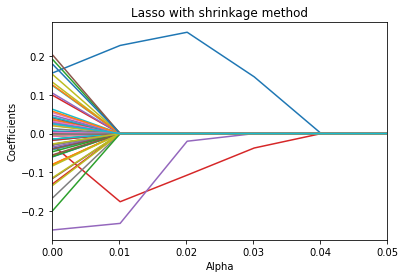

In [ ]:
# Interpret Lasso models by using shrinkage method and plot it
alphas_list = []
all_coeff_list = []

for alph in np.linspace(0.0001, 10, 1000):
  alphas_list.append(alph)
  lasso = Lasso(alpha=alph, max_iter=300)
  lasso.fit(X, y)
  all_coeff_list.append(lasso.coef_)

plt.title('Lasso with shrinkage method')
plt.xlabel('Alpha')
plt.ylabel('Coefficients')
plt.xlim([0, 0.050])

plt.plot(alphas_list, all_coeff_list)


Find the long-lived features:

In [ ]:
np.linspace(0.0001, 10, 1000)[:10]

array([0.0001    , 0.01010991, 0.02011982, 0.03012973, 0.04013964,
       0.05014955, 0.06015946, 0.07016937, 0.08017928, 0.09018919])

In [ ]:
for i in all_coeff_list[0:10]:
  print(i)

[-0.          0.          0.18920725 -0.03067983 -0.00029448  0.03478042
  0.0027136  -0.16414984  0.          0.00710236 -0.03795925  0.03582235
  0.         -0.12837863  0.02948146 -0.11446789  0.03146931  0.
 -0.07949736  0.          0.         -0.07825391 -0.01428357 -0.02746408
  0.02600697  0.04000402  0.02362053 -0.         -0.13237533 -0.04146413
  0.          0.02192744 -0.01470334  0.09772825 -0.03422141  0.
  0.02124584  0.          0.13090771  0.12240245 -0.05927609 -0.
  0.         -0.         -0.24771269 -0.03958794 -0.          0.
 -0.11261633 -0.01729274  0.15650164 -0.07906748  0.00084842 -0.
 -0.         -0.          0.          0.          0.01991126  0.
 -0.         -0.05617049 -0.04632701 -0.01698181  0.10306276 -0.00700716
 -0.00497248 -0.02952705  0.15073374  0.04247549  0.00501302  0.12399846
 -0.05853427  0.          0.04702865 -0.05423881 -0.00683424  0.01234105
 -0.00322598 -0.01386876 -0.          0.         -0.19682597  0.
  0.          0.2007686   0.053261

We can see the coefficient of all features (100) become 0 if alpha is greater than or equal to 0.03012973. Hence, it's enough if I only investigate which features are in life (see below)

In [ ]:

alph = np.linspace(0.0001, 10, 100)[:4]
for id, alph in enumerate(alph):
  # Find survived features indices
  good_ids = np.where(all_coeff_list[id] != 0)
  # Index those features
  survived_features = X.columns[good_ids]
  print('\nWhen alpha is {}, then survived features: {}'.format(alph, survived_features))



When alpha is 0.0001, then survived features: Index(['racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp',
       'agePct12t21', 'agePct12t29', 'agePct65up', 'numbUrban', 'pctUrban',
       'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWRetire',
       'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap',
       'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade',
       'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu',
       'PctOccupManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv',
       'PctKids2Par', 'PctYoungKids2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg',
       'NumImmig', 'PctImmigRecent', 'PctRecImmig8', 'PctNotSpeakEnglWell',
       'PctLargHouseFam', 'PctLargHouseOccup', 'PersPerOccupHous',
       'PersPerOwnOccHous', 'PersPerRentOccHous', 'PctPersOwnOccup',
       'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant',
       'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt',
     

In [ ]:
# Search for best parameters for Ridge model 
param_dicty = {'alpha' : np.linspace(0.0001, 10, 1000),
               'max_iter' : range(1, 200, 10)}
ridge = Ridge(normalize=False)
grid = GridSearchCV(ridge, param_grid=param_dicty, cv=5, n_jobs=4)
grid.fit(X, y)

GridSearchCV(cv=5, error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=4,
             param_grid={'alpha': array([1.00000000e-04, 1.01099099e-02, 2.01198198e-02, 3.01297297e-02,
       4.01396396e-02, 5.01495495e-02, 6.01594595e-02, 7.01693694e-02,
       8.01792793e-0...
       9.84985135e+00, 9.85986126e+00, 9.86987117e+00, 9.87988108e+00,
       9.88989099e+00, 9.89990090e+00, 9.90991081e+00, 9.91992072e+00,
       9.92993063e+00, 9.93994054e+00, 9.94995045e+00, 9.95996036e+00,
       9.96997027e+00, 9.97998018e+00, 9.98999009e+00, 1.00000000e+01]),
                         'max_iter': range(1, 200, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
grid.best_params_

{'alpha': 1.7117945945945947, 'max_iter': 1}

In [ ]:
grid.best_score_

0.6569645339083626

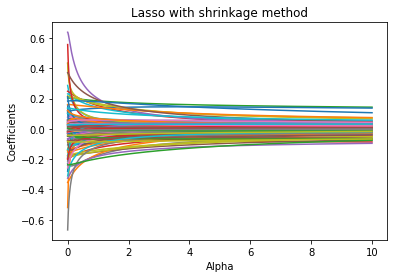

In [ ]:
# Interpret Ridge models by using shrinkage method and plot it
alphas_list = []
all_coeff_list2 = []

for alph in np.linspace(0.0001, 10, 1000):
  alphas_list.append(alph)
  ridge = Ridge(alpha=alph, max_iter=1)
  ridge.fit(X, y)
  all_coeff_list2.append(ridge.coef_)

plt.title('Lasso with shrinkage method')
plt.xlabel('Alpha')
plt.ylabel('Coefficients')

plt.plot(alphas_list, all_coeff_list2)

Normalization is **not** needed because on one hand the downloaded data is already normalized as it is written on website page from where the data was downloaded and on the other hand GridSearchCV proved this information, since it estimated the best parameter settings for both models(Lasso, Ridge) which says that normalization is not required. 

# 4. Subset selection
- Split the data to training and test sets and do recursice feature elimination until 10 remaining predictors with 5-fold cross-validated regressors (RidgeCV, LassoCV, ElasticNetCV) on the training set, plot their names and look up some of their meanings [ recursive feature elimination is part of sklearn but you can do it with a for loop if you whish ]

- Do all models provide the same descriptors? Check their performance on the test set! Plot all model predictions compared to the y_test on 3 different plots, which model seems to be the best?

In [ ]:
# Split the data training and test tests (70:30)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [ ]:
# Create 3 models calling dictionary
lassocv = LassoCV(cv=5)
ridgecv = RidgeCV(cv=5)
elasticnetcv = ElasticNetCV(cv=5)
model_dicty = {'lasso' : lassocv,
               'ridge' : ridgecv,
               'elasticnet' : elasticnetcv}

# Create result dictionary
result_dicty  = {key : [] for key in model_dicty.keys()}

# Run RFE for 3 models and store the first 10 important features of them
for key in model_dicty.keys():
  print(key)
  model = model_dicty[key]
  rfe = RFE(estimator=model, n_features_to_select=10)
  rfe = rfe.fit(X_train, y_train)
  print(rfe.support_)
  print(len(rfe.support_))
  print(type(rfe.support_))
  print(rfe.ranking_)
  print(len(rfe.ranking_))
  print(type(rfe.ranking_))
  print(np.where(rfe.ranking_ == rfe.ranking_.min()))
  important_features_ids = np.where(rfe.ranking_ == rfe.ranking_.min())
  result_dicty[key] = X.columns[important_features_ids]





lasso


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.010630194824962302, tolerance: 0.0062726248387096764
  tol, rng, random, positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.011646393374579844, tolerance: 0.0062726248387096764
  tol, rng, random, positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.008113530512211753, tolerance: 0.006104427983870969
  tol, rng, random, positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You 

[False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False  True False False False False False False False
 False False False False False False False False  True False False False
 False  True False  True False False False False False False False False
 False False False False False False False False  True False False  True
 False False False False False False False False False False  True False
 False  True False False False False  True False False False False False
 False False False False]
100
<class 'numpy.ndarray'>
[91 90  1 69 60 37 58  5 57 75 50 51 73 48 45 11 12 56 46 30 16 14 63 54
 62 55 47 79  1 43 72 13  8 27 40 68 41 78 10  7 39 80 82 84  1 15 61  3
  2  1 24  1 34 83 85 44 33 89 49 38 67 25 42  4  6 32 28 31  1  9 71  1
 22 87 26 23 59 76 52 19 77 29  1 74 36  1 66 65 18 17  1 20 88 86 70 21
 53 64 81 35]
100
<class 'numpy.ndarray'>
(array([ 2, 28, 44, 49, 51, 

In [ ]:
# Make dataframe from result dictionary for better understanding

pd.DataFrame.from_dict(result_dicty)

,lasso,ridge,elasticnet
0,racepctblack,racepctblack,racepctblack
1,PctPopUnderPov,PctKids2Par,PctPopUnderPov
2,PctKids2Par,NumImmig,PctKids2Par
3,NumIlleg,PctRecImmig5,NumIlleg
4,NumImmig,PctRecImmig8,NumImmig
5,PctPersDenseHous,PctPersDenseHous,PctPersDenseHous
6,HousVacant,HousVacant,HousVacant
7,RentLowQ,RentLowQ,RentLowQ
8,MedRent,MedRent,MedRent
9,NumStreet,NumStreet,NumStreet


racepctblack: percentage of population that is african american

PctPopUnderPov: percentage of people under the poverty level 

PctKids2Par: percentage of kids in family housing with two parents

NumImmig: total number of people known to be foreign born

NumIlleg: number of kids born to never married

PctRecImmig5: percent of _population_ who have immigrated within the last 5 years

PctRecImmig8: percent of _population_ who have immigrated within the last 8 years

PctPersDenseHous: percent of persons in dense housing (more than 1 person per room) 

HousVacant: number of vacant households 

RentLowQ: rental housing - lower quartile rent 

MedRent: median gross rent (Census variable H43A from file STF3A - includes utilities) 

NumStreet: number of homeless people counted in the street 

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.010630194824962302, tolerance: 0.0062726248387096764
  tol, rng, random, positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.011646393374579844, tolerance: 0.0062726248387096764
  tol, rng, random, positive)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:472: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.008113530512211753, tolerance: 0.006104427983870969
  tol, rng, random, positive)


R2 score of lasso: 0.6361350828319282
RMSE of lasso : 0.13870846584758645
R2 score of ridge: 0.6398523736824844
RMSE of ridge : 0.13799811515690483
R2 score of elasticnet: 0.6367743691009542
RMSE of elasticnet : 0.13858656154129995


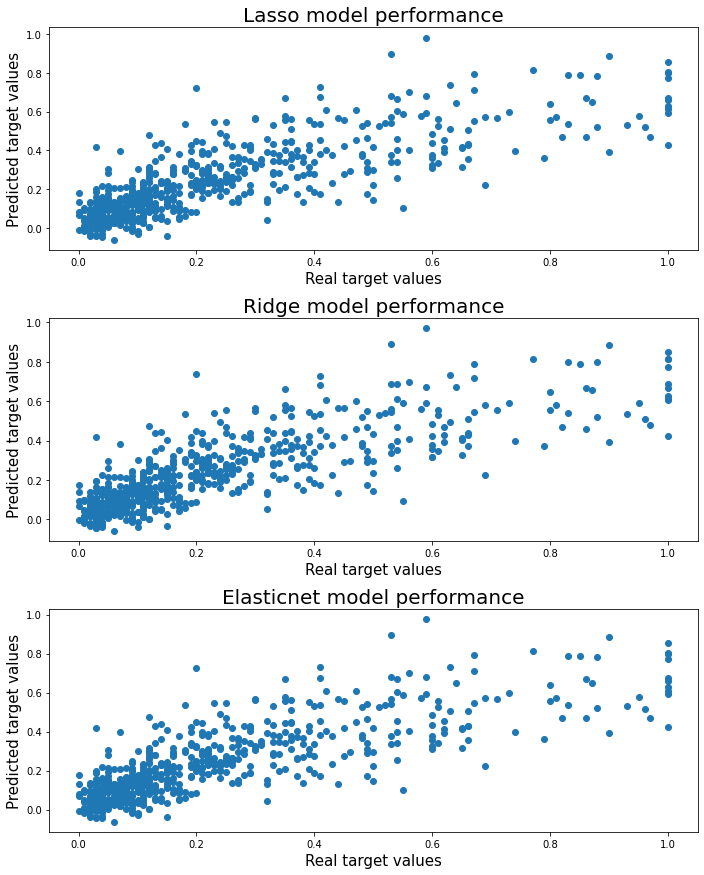

In [ ]:
# Check performance of models on test set and plot all model predictions compared to the y_test on 3 different plots

# Create 3 subplots
fig, axs = plt.subplots(3, figsize=(10, 12))

id = 0

for key, model in model_dicty.items():
  # extract important features from training data and test data
  X_train_imp_features = X_train[result_dicty[key]]
  X_test_imp_features = X_test[result_dicty[key]]
  # Fit the current model
  model.fit(X_train, y_train)
  # Predict y for test data
  y_pred = model.predict(X_test)
  
  # Plotting part 
  fig.tight_layout() # to prevent overlapping subplots
  # Plot real y and predicted y
  axs[id].plot(y_test, y_pred, 'o')
  axs[id].set_title('{} model performance'.format(key.capitalize()), fontsize=20)
  axs[id].set_xlabel('Real target values', fontsize=15)
  axs[id].set_ylabel('Predicted target values', fontsize=15)

  # Calculate R2 and RMSE 
  print('R2 score of {}: {}'.format(key, r2_score(y_test, y_pred)))
  print('RMSE of {} : {}'.format(key, np.sqrt(mean_squared_error(y_test, y_pred))))
  id += 1


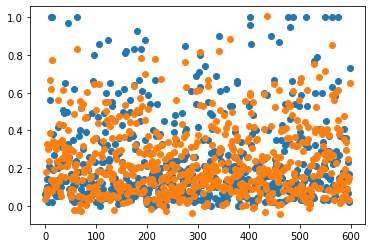

In [ ]:
X_train_imp_features = X_train[result_dicty['elasticnet']]
X_test_imp_features = X_test[result_dicty['elasticnet']]
# Fit the current model
lassocv.fit(X_train_imp_features, y_train)
# Predict y for test data
y_pred = lassocv.predict(X_test_imp_features)
# Plot real y and predicted y
plt.scatter([i for i in range(len(X_test_imp_features))], y_test)
plt.scatter([i for i in range(len(X_test_imp_features))], y_pred)
  